# 목차

- 개체명 인식기 불러오기
- 데이터 불러오기
    - per:place_of_residence 라벨의 실제 [subject_entity와 object_entity와] 개체명 분석 결과를 비교하여 개체명 인식기 성능 확인 -> 개체명 인식기로 [subject_entity와 object_entity를 잘 포착해냄을] 확인
- 함수화 ( ner 분석이 완료된 데이터프레임을 불러와서, 특정 subject_entity_type과 object_entity_type을 만족하는 샘플들만 추출된 데이터 프레임을 반환 )

- [오답률 1위 0.9375 및 데이터 부족] per_place_of_residence 라벨을 제외한 sentence에서 인물과 국가가 동시에 등장하는 sentence 추출
    - 데이터 증강 -> 함수화
    - 증강 후 결과 확인 밎 저장 (192 -> 500) [+ 308]

- [오답률 2위 0.8181 및 데이터 부족] per:other_family 의 개체명 분석
    - 분석 결과

## 개체명 인식기 불러오기

In [2]:
### 아래 코드는 앞서 kor_ner_test.ipynb에서 이미 하셨다면 안하셔도 됩니다.
# !git clone https://github.com/KPFBERT/kpfbert.git
# !pip install kss

In [1]:
###########################################################################################################
"""
ner_module.py : 추론 관련 코드.
- 실행하는 폴더에 predict.py, label.py, kpf-bert, kpf-bert-ner 폴더가 있어야함.
input : text (sentence)
output : word, label, desc (predict results by kpf-bert-ner)
"""
###########################################################################################################

from transformers import AutoTokenizer, BertForTokenClassification, logging
logging.set_verbosity_error()
import sys, os, torch
import numpy as np
sys.path.insert(0, '../')
import label
import kss

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"


/opt/conda/envs/nlp/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [129]:
# tokenizer 및 model 불러오기
tokenizer = AutoTokenizer.from_pretrained("kpfbert")
# huggingface 개체명 인식 모델 불러오기
model = BertForTokenClassification.from_pretrained("KPF/KPF-bert-ner")

def ner_predict(text):
    text = text.replace('\n','')
    model.to("cuda")

    sents = kss.split_sentences(text)
    decoding_ner_sentence = ""
    word_list = list()
    pred_str = list()

    #text to model input
    for idx, sent in enumerate(sents):

        sent = sent.replace(" ", "-")
        test_tokenized = tokenizer(sent, return_tensors="pt")

        test_input_ids = test_tokenized["input_ids"].to("cuda")
        test_attention_mask = test_tokenized["attention_mask"].to("cuda")
        test_token_type_ids = test_tokenized["token_type_ids"].to("cuda")

        inputs = {
            "input_ids" : test_input_ids,
            "attention_mask" : test_attention_mask,
            "token_type_ids" : test_token_type_ids
        }

        if inputs['input_ids'].size()[1] > 512:
            cnt = int(inputs['input_ids'].size()[1])

            inp_np = inputs['input_ids'].cpu().numpy()
            att_np = inputs['attention_mask'].cpu().numpy()
            tok_np = inputs['token_type_ids'].cpu().numpy()

            for i in range(cnt):
                slice_inp = inp_np[0][(i*512):((i+1)*512)]
                slice_att = att_np[0][(i * 512):((i + 1) * 512)]
                slice_tok = tok_np[0][(i * 512):((i + 1) * 512)]

                slice_inp = slice_inp.reshape(1, len(slice_inp))
                slice_att = slice_att.reshape(1, len(slice_att))
                slice_tok = slice_tok.reshape(1, len(slice_tok))

                slice_inp = torch.tensor(slice_inp)
                slice_att = torch.tensor(slice_att)
                slice_tok = torch.tensor(slice_tok)

                slice_inp = torch.tensor(slice_inp).to("cuda")
                slice_att = torch.tensor(slice_att).to("cuda")
                slice_tok = torch.tensor(slice_tok).to("cuda")

                slice_inputs = {
                    "input_ids": slice_inp,
                    "attention_mask": slice_att,
                    "token_type_ids": slice_tok
                }

                # predict
                outputs = model(**slice_inputs)

                token_predictions = outputs[0].argmax(dim=2)
                token_prediction_list = token_predictions.squeeze(0).tolist()

                pred = [label.id2label[l] for l in token_prediction_list]

                pred_str = np.concatenate((pred_str, pred))
        else:
            #predict
            outputs = model(**inputs)

            token_predictions = outputs[0].argmax(dim=2)
            token_prediction_list = token_predictions.squeeze(0).tolist()

            pred_str = [label.id2label[l] for l in token_prediction_list]
        tt_tokenized = tokenizer(sent).encodings[0].tokens

        # decoding_ner_sentence = ""
        is_prev_entity = False
        prev_entity_tag = ""
        is_there_B_before_I = False
        _word = ""
        # word_list = list()

        #model output to text
        for i, (token, pred) in enumerate(zip(tt_tokenized, pred_str)):
            if i == 0 or i == len(pred_str) - 1:
                continue
            token = token.replace('#', '').replace("-", " ")

            if token == "":
                continue

            if 'B-' in pred:
                if is_prev_entity is True:
                    decoding_ner_sentence += ':' + prev_entity_tag+ '>'
                    word_list.append({"word" : _word, "label" : prev_entity_tag, "desc" : "1"})
                    _word = ""

                if token[0] == ' ':
                    token = list(token)
                    token[0] = ' <'
                    token = ''.join(token)
                    decoding_ner_sentence += token
                    _word += token
                else:
                    decoding_ner_sentence += '<' + token
                    _word += token
                is_prev_entity = True
                prev_entity_tag = pred[2:]
                is_there_B_before_I = True

            elif 'I-' in pred:
                decoding_ner_sentence += token
                _word += token

                if is_there_B_before_I is True:
                    is_prev_entity = True
            else:
                if is_prev_entity is True:
                    decoding_ner_sentence += ':' + prev_entity_tag+ '>' + token
                    is_prev_entity = False
                    is_there_B_before_I = False
                    if prev_entity_tag in label.ner_code:
                        word_list.append({"word" : _word, "label" : prev_entity_tag, "desc" : label.ner_code[prev_entity_tag]})
                    else:
                        pass
                    # word_list.append({"word" : _word, "label" : prev_entity_tag, "desc" : label.ner_code[prev_entity_tag]})
                    _word = ""
                else:
                    decoding_ner_sentence += token

    # print("OUTPUT")
    # print("sentence : ", decoding_ner_sentence)
    # print("result : ", word_list)
    return word_list


In [28]:
ner_predict('이순신은 조선 중기의 무신이다.')

[{'word': '이순신', 'label': 'PS_NAME', 'desc': '인물'},
 {'word': '조선', 'label': 'LCP_COUNTRY', 'desc': '국가'}]

## 데이터 불러오기

In [4]:
import pandas as pd
import tqdm

In [6]:
ls

__pycache__/  kor_ner_test.ipynb  kpfbert/  label.py  ner_augment.ipynb


In [16]:
without_dup_train = pd.read_csv('/data/ephemeral/level2-klue-nlp-06/dataset/without_dup_train.csv')
without_dup_dev = pd.read_csv('/data/ephemeral/level2-klue-nlp-06/dataset/without_dup_dev.csv')

In [183]:
total_df = pd.concat([without_dup_train, without_dup_dev], axis=0)
total_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...","{'word': '율리오 1세', 'start_idx': 27, 'end_idx':...","{'word': '리베리오', 'start_idx': 1, 'end_idx': 4,...",no_relation,wikipedia
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,"{'word': '콘라트 2세', 'start_idx': 52, 'end_idx':...","{'word': '기젤라', 'start_idx': 60, 'end_idx': 62...",per:spouse,wikipedia
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,"{'word': '자유민주연합', 'start_idx': 55, 'end_idx':...","{'word': '한나라당', 'start_idx': 77, 'end_idx': 8...",no_relation,wikipedia
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...","{'word': '고창군', 'start_idx': 4, 'end_idx': 6, ...","{'word': '전라북도', 'start_idx': 9, 'end_idx': 12...",org:member_of,wikitree
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,"{'word': '한국기록원', 'start_idx': 37, 'end_idx': ...","{'word': 'KRI', 'start_idx': 33, 'end_idx': 35...",org:alternate_names,wikitree
...,...,...,...,...,...,...
3237,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...","{'word': '홍현우', 'start_idx': 87, 'end_idx': 89...","{'word': '2루수', 'start_idx': 92, 'end_idx': 94...",no_relation,wikipedia
3238,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...","{'word': '하토야마 유키오', 'start_idx': 40, 'end_idx...","{'word': '2009년 9월 16일', 'start_idx': 0, 'end_...",no_relation,wikipedia
3239,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,"{'word': '개로왕', 'start_idx': 52, 'end_idx': 54...","{'word': '문주왕', 'start_idx': 74, 'end_idx': 76...",per:children,wikipedia
3240,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,"{'word': '신숭겸', 'start_idx': 38, 'end_idx': 40...","{'word': '927년', 'start_idx': 15, 'end_idx': 1...",per:date_of_death,wikipedia


### per:place_of_residence 라벨의 개체명 분석 결과 확인

In [184]:
per_place_of_residence = total_df[total_df['label'] == 'per:place_of_residence']
per_place_of_residence

,id,sentence,subject_entity,object_entity,label,source
408,16911,이타마르 프랑쿠 브라질 대통령은 1994년 2월 10일 브라질 우주국 AEB(Agê...,"{'word': '이타마르 프랑쿠', 'start_idx': 0, 'end_idx'...","{'word': '브라질', 'start_idx': 9, 'end_idx': 11,...",per:place_of_residence,wikipedia
632,1662,"이날 토론회에는 경상북도의회 장경식 의장과 이철우 경북도지사, 임종식 경북교육감을 ...","{'word': '이채익', 'start_idx': 232, 'end_idx': 2...","{'word': '울산 남구', 'start_idx': 239, 'end_idx':...",per:place_of_residence,wikitree
812,8414,2014년 2월 보홀의 르네 렐람파고스 하원의원이 제출한 또 다른 법안은 호세 리잘...,"{'word': '호세 리잘', 'start_idx': 41, 'end_idx': ...","{'word': '필리핀', 'start_idx': 52, 'end_idx': 54...",per:place_of_residence,wikipedia
943,11759,"모하메드 알파예드(Mohamed Abdel Moneim Al-Fayed, 1929년...","{'word': '모하메드 알파예드', 'start_idx': 0, 'end_idx...","{'word': '이집트', 'start_idx': 58, 'end_idx': 60...",per:place_of_residence,wikipedia
1078,16532,이날 발대식에는 ▵부산경찰청 산하 15개 경찰서 직원협의회 대표 ▵자유한국당 유재중...,"{'word': '유재중', 'start_idx': 43, 'end_idx': 45...","{'word': '부산 수영구', 'start_idx': 52, 'end_idx':...",per:place_of_residence,wikitree
...,...,...,...,...,...,...
2392,30212,누르술탄 나자르바예프가 독립 이후 카자흐스탄의 대통령으로 선출되었다.,"{'word': '나자르바예프', 'start_idx': 5, 'end_idx': ...","{'word': '카자흐스탄', 'start_idx': 19, 'end_idx': ...",per:place_of_residence,wikipedia
2517,5074,"경기도 의정부시 갑의 오영환, 의왕시·과천시의 이소영, 서울 동대문구 을의 장경태,...","{'word': '장경태', 'start_idx': 42, 'end_idx': 44...","{'word': '서울 동대문구 을', 'start_idx': 31, 'end_id...",per:place_of_residence,wikipedia
2573,24431,장 의원은 “국회에서 5.18진상규명특별법이 통과되는 즉시 진상조사특위가 차질없이 ...,"{'word': '전두환', 'start_idx': 95, 'end_idx': 97...","{'word': '연희동', 'start_idx': 132, 'end_idx': 1...",per:place_of_residence,wikitree
2728,20013,2006년 대한민국의 노무현 대통령은 한일 관계 특별 담화를 발표하고 일본에 사과에...,"{'word': '노무현', 'start_idx': 12, 'end_idx': 14...","{'word': '대한민국', 'start_idx': 6, 'end_idx': 9,...",per:place_of_residence,wikipedia


In [189]:
print(per_place_of_residence['subject_entity'][408])
per_place_of_residence['object_entity'][408]

{'word': '이타마르 프랑쿠', 'start_idx': 0, 'end_idx': 7, 'type': 'PER'}


"{'word': '브라질', 'start_idx': 9, 'end_idx': 11, 'type': 'LOC'}"

In [85]:
# per:place_of_residence 라벨의 개체명 분석 결과 확인
ners = total_df[total_df['label'] == 'per:place_of_residence']['sentence'].map(lambda x : ner_predict(x))

Key AFA_MUSIC not found in label.ner_code
Key AFA_PERFORMANCE not found in label.ner_code
Key AFA_PERFORMANCE not found in label.ner_code
Key AFA_MUSIC not found in label.ner_code
Key AFA_MUSIC not found in label.ner_code
Key AFA_MUSIC not found in label.ner_code
Key AFA_VIDEO not found in label.ner_code
Key AFA_DOCUMENT not found in label.ner_code
Key AFA_VIDEO not found in label.ner_code
Key AFA_VIDEO not found in label.ner_code
Key AFA_VIDEO not found in label.ner_code
Key AFA_VIDEO not found in label.ner_code
Key AFA_DOCUMENT not found in label.ner_code
Key AFA_DOCUMENT not found in label.ner_code
Key AFA_DOCUMENT not found in label.ner_code
Key AFA_DOCUMENT not found in label.ner_code


In [40]:
ners

408     [{'word': '이타마르 프랑쿠', 'label': 'PS_NAME', 'des...
632     [{'word': '이날', 'label': 'DT_DAY', 'desc': '날짜...
812     [{'word': '2014년 2월', 'label': 'DT_DURATION', ...
943     [{'word': '모하메드 알파예드', 'label': 'PS_NAME', 'de...
1078    [{'word': '이날', 'label': 'DT_DAY', 'desc': '날짜...
                              ...                        
2392    [{'word': '누르술탄', 'label': 'PS_NAME', 'desc': ...
2517    [{'word': '경기도', 'label': 'LCP_PROVINCE', 'des...
2573    [{'word': '장', 'label': 'PS_NAME', 'desc': '인물...
2728    [{'word': '2006년', 'label': 'DT_YEAR', 'desc':...
3191    [{'word': '경기도', 'label': 'LCP_PROVINCE', 'des...
Name: sentence, Length: 192, dtype: object

In [86]:
per_place_of_residence['ners']=ners

/tmp/ipykernel_33033/2663073350.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['ners']=ners


### 깔끔하게 전처리

In [57]:
import ast

In [87]:
# subject, object entity의 값을 word 값으로 변경

per_place_of_residence['subject_entity'] = per_place_of_residence['subject_entity'].apply(lambda x: ast.literal_eval(x)) # turn string formatted like dict into real dict
per_place_of_residence['object_entity'] = per_place_of_residence['object_entity'].apply(lambda x: ast.literal_eval(x))


per_place_of_residence['subject_entity'] = per_place_of_residence['subject_entity'].apply(lambda x: x['word'])
per_place_of_residence['object_entity'] = per_place_of_residence['object_entity'].apply(lambda x: x['word'])

/tmp/ipykernel_33033/2379331011.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['subject_entity'] = per_place_of_residence['subject_entity'].apply(lambda x: ast.literal_eval(x)) # turn string formatted like dict into real dict
/tmp/ipykernel_33033/2379331011.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['object_entity'] = per_place_of_residence['object_entity'].apply(lambda x: ast.literal_eval(x))
/tmp/ipykernel_33033/2379331011.py:7: SettingWithCopyWa

In [88]:
per_place_of_residence.reset_index(drop=True, inplace=True)

In [89]:
per_place_of_residence

,id,sentence,subject_entity,object_entity,label,source,ners
0,16911,이타마르 프랑쿠 브라질 대통령은 1994년 2월 10일 브라질 우주국 AEB(Agê...,이타마르 프랑쿠,브라질,per:place_of_residence,wikipedia,"[{'word': '이타마르 프랑쿠', 'label': 'PS_NAME', 'des..."
1,1662,"이날 토론회에는 경상북도의회 장경식 의장과 이철우 경북도지사, 임종식 경북교육감을 ...",이채익,울산 남구,per:place_of_residence,wikitree,"[{'word': '이날', 'label': 'DT_DAY', 'desc': '날짜..."
2,8414,2014년 2월 보홀의 르네 렐람파고스 하원의원이 제출한 또 다른 법안은 호세 리잘...,호세 리잘,필리핀,per:place_of_residence,wikipedia,"[{'word': '2014년 2월', 'label': 'DT_DURATION', ..."
3,11759,"모하메드 알파예드(Mohamed Abdel Moneim Al-Fayed, 1929년...",모하메드 알파예드,이집트,per:place_of_residence,wikipedia,"[{'word': '모하메드 알파예드', 'label': 'PS_NAME', 'de..."
4,16532,이날 발대식에는 ▵부산경찰청 산하 15개 경찰서 직원협의회 대표 ▵자유한국당 유재중...,유재중,부산 수영구,per:place_of_residence,wikitree,"[{'word': '이날', 'label': 'DT_DAY', 'desc': '날짜..."
...,...,...,...,...,...,...,...
187,30212,누르술탄 나자르바예프가 독립 이후 카자흐스탄의 대통령으로 선출되었다.,나자르바예프,카자흐스탄,per:place_of_residence,wikipedia,"[{'word': '누르술탄', 'label': 'PS_NAME', 'desc': ..."
188,5074,"경기도 의정부시 갑의 오영환, 의왕시·과천시의 이소영, 서울 동대문구 을의 장경태,...",장경태,서울 동대문구 을,per:place_of_residence,wikipedia,"[{'word': '경기도', 'label': 'LCP_PROVINCE', 'des..."
189,24431,장 의원은 “국회에서 5.18진상규명특별법이 통과되는 즉시 진상조사특위가 차질없이 ...,전두환,연희동,per:place_of_residence,wikitree,"[{'word': '장', 'label': 'PS_NAME', 'desc': '인물..."
190,20013,2006년 대한민국의 노무현 대통령은 한일 관계 특별 담화를 발표하고 일본에 사과에...,노무현,대한민국,per:place_of_residence,wikipedia,"[{'word': '2006년', 'label': 'DT_YEAR', 'desc':..."


In [90]:
# 각 행의 ners의 값에서 word와 그 desc를 튜플로 묶어 리스트로 변환

per_place_of_residence['ners'] = per_place_of_residence['ners'].apply(lambda x: [(i['word'], i['desc']) for i in x])

/tmp/ipykernel_33033/770884196.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['ners'] = per_place_of_residence['ners'].apply(lambda x: [(i['word'], i['desc']) for i in x])


In [91]:
per_place_of_residence

,id,sentence,subject_entity,object_entity,label,source,ners
0,16911,이타마르 프랑쿠 브라질 대통령은 1994년 2월 10일 브라질 우주국 AEB(Agê...,이타마르 프랑쿠,브라질,per:place_of_residence,wikipedia,"[(이타마르 프랑쿠, 인물), (브라질, 국가), (대통령, 직위, 직책), (19..."
1,1662,"이날 토론회에는 경상북도의회 장경식 의장과 이철우 경북도지사, 임종식 경북교육감을 ...",이채익,울산 남구,per:place_of_residence,wikitree,"[(이날, 날짜 절기), (경상북도의회, 정부 행정), (장경식, 인물), (의장,..."
2,8414,2014년 2월 보홀의 르네 렐람파고스 하원의원이 제출한 또 다른 법안은 호세 리잘...,호세 리잘,필리핀,per:place_of_residence,wikipedia,"[(2014년 2월, 기간), (보홀, 도시), (르네 렐람파고스, 인물), (하원..."
3,11759,"모하메드 알파예드(Mohamed Abdel Moneim Al-Fayed, 1929년...",모하메드 알파예드,이집트,per:place_of_residence,wikipedia,"[(모하메드 알파예드, 인물), (Mohamed Abdel Moneim Al Fay..."
4,16532,이날 발대식에는 ▵부산경찰청 산하 15개 경찰서 직원협의회 대표 ▵자유한국당 유재중...,유재중,부산 수영구,per:place_of_residence,wikitree,"[(이날, 날짜 절기), (15개, 수량), (의회대표, 직위, 직책), (유재중,..."
...,...,...,...,...,...,...,...
187,30212,누르술탄 나자르바예프가 독립 이후 카자흐스탄의 대통령으로 선출되었다.,나자르바예프,카자흐스탄,per:place_of_residence,wikipedia,"[(누르술탄, 인물), (나자르바예프, 인물), (카자흐스탄, 국가), (대통령, ..."
188,5074,"경기도 의정부시 갑의 오영환, 의왕시·과천시의 이소영, 서울 동대문구 을의 장경태,...",장경태,서울 동대문구 을,per:place_of_residence,wikipedia,"[(경기도, 도, 주), (의정부시, 도시), (갑의, 군, 면, 동), (오영환,..."
189,24431,장 의원은 “국회에서 5.18진상규명특별법이 통과되는 즉시 진상조사특위가 차질없이 ...,전두환,연희동,per:place_of_residence,wikitree,"[(장, 인물), (의원, 직위, 직책), (국회, 정부 행정), (5.18진상규명..."
190,20013,2006년 대한민국의 노무현 대통령은 한일 관계 특별 담화를 발표하고 일본에 사과에...,노무현,대한민국,per:place_of_residence,wikipedia,"[(2006년, 년), (대한민국, 국가), (노무현, 인물), (대통령, 직위, ..."


In [92]:
# 모든 행을 순회하며 subject_entity와 object_entity 둘 다 ners에 있는지 확인 및 그에 따른 label 부여

per_place_of_residence['label'] = None

for i in tqdm.tqdm(range(len(per_place_of_residence))):

    if per_place_of_residence['subject_entity'][i] in [j[0] for j in per_place_of_residence['ners'][i]] and per_place_of_residence['object_entity'][i] in [j[0] for j in per_place_of_residence['ners'][i]]:
        per_place_of_residence['label'][i] = 'both'
    elif per_place_of_residence['subject_entity'][i] in [j[0] for j in per_place_of_residence['ners'][i]]:
        per_place_of_residence['label'][i] = 'subject'
    elif per_place_of_residence['object_entity'][i] in [j[0] for j in per_place_of_residence['ners'][i]]:
        per_place_of_residence['label'][i] = 'object'
    else:
        per_place_of_residence['label'][i] = 'none'

/tmp/ipykernel_33033/1884369424.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['label'] = None
  0%|          | 0/192 [00:00<?, ?it/s]/tmp/ipykernel_33033/1884369424.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_place_of_residence['label'][i] = 'both'
/tmp/ipykernel_33033/1884369424.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_pla

In [93]:
per_place_of_residence

,id,sentence,subject_entity,object_entity,label,source,ners
0,16911,이타마르 프랑쿠 브라질 대통령은 1994년 2월 10일 브라질 우주국 AEB(Agê...,이타마르 프랑쿠,브라질,both,wikipedia,"[(이타마르 프랑쿠, 인물), (브라질, 국가), (대통령, 직위, 직책), (19..."
1,1662,"이날 토론회에는 경상북도의회 장경식 의장과 이철우 경북도지사, 임종식 경북교육감을 ...",이채익,울산 남구,subject,wikitree,"[(이날, 날짜 절기), (경상북도의회, 정부 행정), (장경식, 인물), (의장,..."
2,8414,2014년 2월 보홀의 르네 렐람파고스 하원의원이 제출한 또 다른 법안은 호세 리잘...,호세 리잘,필리핀,object,wikipedia,"[(2014년 2월, 기간), (보홀, 도시), (르네 렐람파고스, 인물), (하원..."
3,11759,"모하메드 알파예드(Mohamed Abdel Moneim Al-Fayed, 1929년...",모하메드 알파예드,이집트,subject,wikipedia,"[(모하메드 알파예드, 인물), (Mohamed Abdel Moneim Al Fay..."
4,16532,이날 발대식에는 ▵부산경찰청 산하 15개 경찰서 직원협의회 대표 ▵자유한국당 유재중...,유재중,부산 수영구,subject,wikitree,"[(이날, 날짜 절기), (15개, 수량), (의회대표, 직위, 직책), (유재중,..."
...,...,...,...,...,...,...,...
187,30212,누르술탄 나자르바예프가 독립 이후 카자흐스탄의 대통령으로 선출되었다.,나자르바예프,카자흐스탄,both,wikipedia,"[(누르술탄, 인물), (나자르바예프, 인물), (카자흐스탄, 국가), (대통령, ..."
188,5074,"경기도 의정부시 갑의 오영환, 의왕시·과천시의 이소영, 서울 동대문구 을의 장경태,...",장경태,서울 동대문구 을,subject,wikipedia,"[(경기도, 도, 주), (의정부시, 도시), (갑의, 군, 면, 동), (오영환,..."
189,24431,장 의원은 “국회에서 5.18진상규명특별법이 통과되는 즉시 진상조사특위가 차질없이 ...,전두환,연희동,both,wikitree,"[(장, 인물), (의원, 직위, 직책), (국회, 정부 행정), (5.18진상규명..."
190,20013,2006년 대한민국의 노무현 대통령은 한일 관계 특별 담화를 발표하고 일본에 사과에...,노무현,대한민국,both,wikipedia,"[(2006년, 년), (대한민국, 국가), (노무현, 인물), (대통령, 직위, ..."


In [94]:
per_place_of_residence.value_counts('label')

label
both       90
subject    46
object     43
none       13
Name: count, dtype: int64

In [95]:
# label이 both인 것만 추출

both_per_place_of_residence = per_place_of_residence[per_place_of_residence['label'] == 'both']

In [99]:
# 각 행을 순회하며 subject_entity와 object_entity에 해당하는 ners의 튜플을 추출해서 리스트로 변환

both_per_place_of_residence['subject_ners'] = None
both_per_place_of_residence['object_ners'] = None

both_per_place_of_residence.reset_index(drop=True, inplace=True)
for i in tqdm.tqdm(range(len(both_per_place_of_residence))):
    both_per_place_of_residence['subject_ners'][i] = [j for j in both_per_place_of_residence['ners'][i] if j[0] == both_per_place_of_residence['subject_entity'][i]]
    both_per_place_of_residence['object_ners'][i] = [j for j in both_per_place_of_residence['ners'][i] if j[0] == both_per_place_of_residence['object_entity'][i]]

/tmp/ipykernel_33033/2323917198.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  both_per_place_of_residence['subject_ners'] = None
/tmp/ipykernel_33033/2323917198.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  both_per_place_of_residence['object_ners'] = None
  0%|          | 0/90 [00:00<?, ?it/s]/tmp/ipykernel_33033/2323917198.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

In [100]:
both_per_place_of_residence

,id,sentence,subject_entity,object_entity,label,source,ners,subject_ners,object_ners
0,16911,이타마르 프랑쿠 브라질 대통령은 1994년 2월 10일 브라질 우주국 AEB(Agê...,이타마르 프랑쿠,브라질,both,wikipedia,"[(이타마르 프랑쿠, 인물), (브라질, 국가), (대통령, 직위, 직책), (19...","[(이타마르 프랑쿠, 인물)]","[(브라질, 국가), (브라질, 국가)]"
1,30198,"김효진(1982년 9월 22일 ~)은 대한민국의 모델, 방송인이다.",김효진,대한민국,both,wikipedia,"[(김효진, 인물), (1982년 9월 22일 ~, 기간), (대한민국, 국가), ...","[(김효진, 인물)]","[(대한민국, 국가)]"
2,4260,"종로구 국회의원인 새정치민주연합의 정세균 상임고문은 ""저를 비롯해 종로 주민들의 극...",정세균,종로구,both,wikipedia,"[(종로구, 군, 면, 동), (국회의원, 직위, 직책), (새정치민주연합, 정부 ...","[(정세균, 인물)]","[(종로구, 군, 면, 동)]"
3,230,다만 역법의 시작을 이슬람력과 동일하게 무함마드 및 그의 추종자들이 메카에서 메디나...,무함마드,메디나,both,wikipedia,"[(무함마드, 인물), (메카, 도시), (메디나, 도시), (622년, 년), (...","[(무함마드, 인물)]","[(메디나, 도시)]"
4,18069,첫 번째 리메이크는 덴마크 가수 리스 쇠렌센이 1993년에 〈Brændt〉로 번역하...,리스 쇠렌센,덴마크,both,wikipedia,"[(첫 번째, 순서), (덴마크, 국가), (가수, 직업), (리스 쇠렌센, 인물)...","[(리스 쇠렌센, 인물)]","[(덴마크, 국가)]"
...,...,...,...,...,...,...,...,...,...
85,14785,독일의 수리논리학자 레오폴트 뢰벤하임(Leopold Löwenheim)과 노르웨이의...,토랄프 스콜렘,노르웨이,both,wikipedia,"[(독일, 국가), (수리논리학자, 직업), (레오폴트 뢰벤하임, 인물), (Leo...","[(토랄프 스콜렘, 인물)]","[(노르웨이, 국가)]"
86,1969,"김길식(金吉植, 1978년 8월 24일 ~)은 대한민국의 은퇴한 축구 선수이자 현 ...",김길식,대한민국,both,wikipedia,"[(김길식, 인물), (金吉植, 인물), (1978년 8월 24일 ~, 기간), (...","[(김길식, 인물)]","[(대한민국, 국가)]"
87,30212,누르술탄 나자르바예프가 독립 이후 카자흐스탄의 대통령으로 선출되었다.,나자르바예프,카자흐스탄,both,wikipedia,"[(누르술탄, 인물), (나자르바예프, 인물), (카자흐스탄, 국가), (대통령, ...","[(나자르바예프, 인물)]","[(카자흐스탄, 국가)]"
88,24431,장 의원은 “국회에서 5.18진상규명특별법이 통과되는 즉시 진상조사특위가 차질없이 ...,전두환,연희동,both,wikitree,"[(장, 인물), (의원, 직위, 직책), (국회, 정부 행정), (5.18진상규명...","[(전두환, 인물)]","[(연희동, 군, 면, 동)]"


In [104]:
# subject_ners의 리스트에서 튜플의 두 번째 값(desc)만 추출
subject_desc= both_per_place_of_residence['subject_ners'].apply(lambda x: x[0][1])
subject_desc.value_counts()

subject_ners
인물     88
캐랙터     2
Name: count, dtype: int64

In [105]:
# object_ners의 리스트에서 튜플의 두 번째 값(desc)만 추출
object_desc= both_per_place_of_residence['object_ners'].apply(lambda x: x[0][1])
object_desc.value_counts()

object_ners
국가         66
도시          9
군, 면, 동     5
수도          3
캐랙터         2
종교          1
인물          1
스포츠         1
왕조시대        1
대륙          1
Name: count, dtype: int64

## 함수화

In [125]:
from tqdm import tqdm
tqdm.pandas()

In [132]:
df = total_df.copy()

# subject_entity, object_entity,source drop
df.drop(['subject_entity', 'object_entity', 'source'], axis=1, inplace=True)

ners = df['sentence'].progress_map(lambda x : ner_predict(x))
df['ners']=ners

print('ners done')

df['ners'] = df['ners'].progress_apply(lambda x: [(i['word'], i['desc']) for i in x])

100%|██████████| 32418/32418 [58:49<00:00,  9.18it/s]  


ners done


100%|██████████| 32418/32418 [00:00<00:00, 135988.63it/s]


In [134]:
# df.to_csv('ners.csv', index=False)

In [135]:
df

,id,sentence,label,ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]"
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,per:spouse,"[(메르센부르크, 인물), (테이도마르, 인물), (Thietmar, 인물), (마..."
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,no_relation,"[(새정치국민회의, 정부 행정), (국회의장, 직위, 직책), (자유민주연합, 정부..."
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...",org:member_of,"[(고창군, 군, 면, 동), (전라북도, 도, 주), ( 16일여성가족부로, 정부..."
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,org:alternate_names,"[(장성아카데미, 교육), (지난해 9월, 기간), (KRI, 정부 행정), (한국..."
...,...,...,...,...
3237,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...",no_relation,"[(1회말, 스포츠수량), (이순철, 인물), (2사1, 스포츠수량), (2루김성한..."
3238,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...",no_relation,"[(2009년 9월 16일, 기간), (아소, 인물), (국회, 정부 행정), (민..."
3239,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,per:children,"[(고구려, 국가), (장수왕, 인물), (412년, 기간), (음력 10월~491..."
3240,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,per:date_of_death,"[(태조, 인물), (왕건, 인물), (927년, 년), (백제와공산성, 인물), ..."


In [144]:
# dataframe과 subject_entity_type, object_entity type을 받아 [sentence, label, subject_ners, object_ners, ners] 컬럼을 가진 dataframe을 반환하는 함수

def make_df(df: pd.pandas.DataFrame , subject_entity_type: str, object_entity_type: str): 
    
    df['ner_label'] = None

    for i in tqdm(range(len(df))):

        if subject_entity_type in [j[1] for j in df['ners'][i] if len(j) > 1] and object_entity_type in [j[1] for j in df['ners'][i] if len(j) > 1]:
            df['ner_label'][i] = 'both'
        elif subject_entity_type in [j[1] for j in df['ners'][i] if len(j) > 1]:
            df['ner_label'][i] = 'subject'
        elif object_entity_type in [j[1] for j in df['ners'][i] if len(j) > 1]:
            df['ner_label'][i] = 'object'
        else:
            df['ner_label'][i] = 'none'


    both_per_place_of_residence['subject_ners'] = None
    both_per_place_of_residence['object_ners'] = None

    both_per_place_of_residence.reset_index(drop=True, inplace=True)
    for i in tqdm(range(len(both_per_place_of_residence))):
        both_per_place_of_residence['subject_ners'][i] = [j for j in both_per_place_of_residence['ners'][i] if j[1] == subject_entity_type]
        both_per_place_of_residence['object_ners'][i] = [j for j in both_per_place_of_residence['ners'][i] if j[1] == object_entity_type]

    df.reset_index(drop=True, inplace=True)

    return df

## per_place_of_residence 라벨을 제외한 sentence에서 인물과 국가가 동시에 등장하는 sentence 추출

In [123]:
total_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...","{'word': '율리오 1세', 'start_idx': 27, 'end_idx':...","{'word': '리베리오', 'start_idx': 1, 'end_idx': 4,...",no_relation,wikipedia
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,"{'word': '콘라트 2세', 'start_idx': 52, 'end_idx':...","{'word': '기젤라', 'start_idx': 60, 'end_idx': 62...",per:spouse,wikipedia
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,"{'word': '자유민주연합', 'start_idx': 55, 'end_idx':...","{'word': '한나라당', 'start_idx': 77, 'end_idx': 8...",no_relation,wikipedia
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...","{'word': '고창군', 'start_idx': 4, 'end_idx': 6, ...","{'word': '전라북도', 'start_idx': 9, 'end_idx': 12...",org:member_of,wikitree
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,"{'word': '한국기록원', 'start_idx': 37, 'end_idx': ...","{'word': 'KRI', 'start_idx': 33, 'end_idx': 35...",org:alternate_names,wikitree
...,...,...,...,...,...,...
3237,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...","{'word': '홍현우', 'start_idx': 87, 'end_idx': 89...","{'word': '2루수', 'start_idx': 92, 'end_idx': 94...",no_relation,wikipedia
3238,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...","{'word': '하토야마 유키오', 'start_idx': 40, 'end_idx...","{'word': '2009년 9월 16일', 'start_idx': 0, 'end_...",no_relation,wikipedia
3239,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,"{'word': '개로왕', 'start_idx': 52, 'end_idx': 54...","{'word': '문주왕', 'start_idx': 74, 'end_idx': 76...",per:children,wikipedia
3240,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,"{'word': '신숭겸', 'start_idx': 38, 'end_idx': 40...","{'word': '927년', 'start_idx': 15, 'end_idx': 1...",per:date_of_death,wikipedia


In [145]:
# total_df에서 per:place_of_residence 라벨 샘플 제거

without_specific_label_total_df = df[df['label'] != 'per:place_of_residence']

In [146]:
# total_df에서 per:place_of_residence 라벨을 제외한 sentence에서 인물과 국가가 동시에 등장하는 sentence 추출
without_specific_label_total_df = without_specific_label_total_df.reset_index(drop=True)
ner_df = make_df(without_specific_label_total_df, '인물', '국가')

  0%|          | 0/32226 [00:00<?, ?it/s]/tmp/ipykernel_33033/3956209194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ner_label'][i] = 'both'
/tmp/ipykernel_33033/3956209194.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ner_label'][i] = 'subject'
/tmp/ipykernel_33033/3956209194.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ner_label'][i] = 'subject'
/tmp/ipykernel_33033/3956209194.py:16: SettingWithCop

In [148]:
ner_df

,id,sentence,label,ners,ner_label
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,per:spouse,"[(메르센부르크, 인물), (테이도마르, 인물), (Thietmar, 인물), (마...",subject
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,no_relation,"[(새정치국민회의, 정부 행정), (국회의장, 직위, 직책), (자유민주연합, 정부...",subject
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...",org:member_of,"[(고창군, 군, 면, 동), (전라북도, 도, 주), ( 16일여성가족부로, 정부...",none
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,org:alternate_names,"[(장성아카데미, 교육), (지난해 9월, 기간), (KRI, 정부 행정), (한국...",none
...,...,...,...,...,...
32221,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...",no_relation,"[(1회말, 스포츠수량), (이순철, 인물), (2사1, 스포츠수량), (2루김성한...",subject
32222,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...",no_relation,"[(2009년 9월 16일, 기간), (아소, 인물), (국회, 정부 행정), (민...",subject
32223,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,per:children,"[(고구려, 국가), (장수왕, 인물), (412년, 기간), (음력 10월~491...",both
32224,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,per:date_of_death,"[(태조, 인물), (왕건, 인물), (927년, 년), (백제와공산성, 인물), ...",subject


In [150]:
# ner_label이 both 인 것만 추출
both_ner_df = ner_df[ner_df['ner_label'] == 'both']
both_ner_df

,id,sentence,label,ners,ner_label
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both
8,1397,1919년 4월 11일 상하이에서 수립된 임시정부로부터 1948년 5월 10일 총선...,per:title,"[(1919년 4월 11일, 기간), (상하이, 도시), (임시정부, 정부 행정),...",both
10,7634,이 곳은 1198년에 세르비아 정교회의 초대 대주교인 성 사바와 그의 아버지인 중세...,org:top_members/employees,"[(1198년, 년), (세르비아, 국가), (정교회, 종교), (사바와, 인물),...",both
18,16598,"4월 26일, 아사히 신문은 쑹타오 (1955년) 중국공산당 중앙위원회 대외연락부 ...",per:employee_of,"[(4월 26일, 기간), (아사히, 미디어 방송), (쑹타오, 인물), (1955...",both
19,8598,플레이오프에서는 2위 현대 유니콘스와 두산 베어스가 맞붙었는데 현대는 1998년부터...,no_relation,"[(2위, 순서), (현대, 경제), (유니콘스, 경제), (두산, 경제), (베어...",both
...,...,...,...,...,...
32206,8908,몬토네로스는 1973년 4월 좌익 페론주의자이자 후안 페론의 전 비서인 엑토르 캄포...,no_relation,"[(몬토네로스, 인물), (1973년 4월, 기간), (후안, 인물), (페론, 인...",both
32213,26849,"라라냐가는 스페인 국가대표팀 경기에 딱 1번 출전했는데, 그 경기는 1988년 2월...",no_relation,"[(라라냐가, 인물), (스페인, 국가), (국가대표팀, 스포츠), (1번, 수량)...",both
32215,3816,"그 후 스웨덴의 말뫼 교향악단의 수석 지휘자, 로열 스톡홀름 필하모닉 및 버밍엄 시...",no_relation,"[(스웨덴, 국가), (말뫼, 인물), (수석, 직위, 직책), (지휘자, 직업),...",both
32216,24208,황진산(1989년 2월 25일 ~)은 대한민국의 축구 선수이며 포지션은 미드필더이다.,per:date_of_birth,"[(황진산, 인물), (1989년 2월 25일 ~, 기간), (대한민국, 국가), ...",both


In [152]:
# label이 no_relation인 것만 추출

no_relation_df = both_ner_df[both_ner_df['label'] == 'no_relation']
no_relation_df

,id,sentence,label,ners,ner_label
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both
19,8598,플레이오프에서는 2위 현대 유니콘스와 두산 베어스가 맞붙었는데 현대는 1998년부터...,no_relation,"[(2위, 순서), (현대, 경제), (유니콘스, 경제), (두산, 경제), (베어...",both
30,665,"475년 백제에서 개로왕이 전사하고, 도읍이 함락될 때 문주왕은 신라군의 도움을 받...",no_relation,"[(475년, 년), (백제, 국가), (개로왕, 인물), (문주왕, 인물), (신...",both
53,15885,"그러나, 헨리 3세의 뒤를 이어 잉글랜드의 왕이 된 에드워드 1세는 르웰린과 대립하...",no_relation,"[(헨리, 인물), (3세, 인물), (잉글랜드, 국가), (왕, 직위, 직책), ...",both
58,1449,"모스크바 시간 기준 2015년 5월 12일, 암살당한 야당인사 보리스 넴초프가 한때...",no_relation,"[(모스크바, 수도), (2015년 5월 12일, 기간), (보리스, 인물), (넴...",both
...,...,...,...,...,...
32157,26666,1348년 흑사병의 창궐과 모로코를 중심으로한 마리니드 왕조의 반격으로 레콩키스타가...,no_relation,"[(1348년, 년), (흑사병, 증상, 증세, 질병), (모로코, 국가), (마리...",both
32182,24648,할아버지는 우당 이회영이고 종조부는 독립운동가이자 대한민국의 부통령을 지낸 이시영이었다.,no_relation,"[(할아버지, 가족관계), (당이회영, 인물), (종조부, 가족관계), (대한민국,...",both
32206,8908,몬토네로스는 1973년 4월 좌익 페론주의자이자 후안 페론의 전 비서인 엑토르 캄포...,no_relation,"[(몬토네로스, 인물), (1973년 4월, 기간), (후안, 인물), (페론, 인...",both
32213,26849,"라라냐가는 스페인 국가대표팀 경기에 딱 1번 출전했는데, 그 경기는 1988년 2월...",no_relation,"[(라라냐가, 인물), (스페인, 국가), (국가대표팀, 스포츠), (1번, 수량)...",both


In [154]:
# 각 행을 순회하며 subject_ners에는 인물에 해당하는 튜플의 리스트, object_ners에는 국가에 해당하는 튜플의 리스트를 추출

no_relation_df['subject_ners'] = None
no_relation_df['object_ners'] = None

no_relation_df.reset_index(drop=True, inplace=True)
for i in tqdm(range(len(no_relation_df))):
    no_relation_df['subject_ners'][i] = [j for j in no_relation_df['ners'][i] if j[1] == '인물']
    no_relation_df['object_ners'][i] = [j for j in no_relation_df['ners'][i] if j[1] == '국가']

/tmp/ipykernel_33033/1612248582.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_relation_df['subject_ners'] = None
/tmp/ipykernel_33033/1612248582.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_relation_df['object_ners'] = None
  0%|          | 0/1908 [00:00<?, ?it/s]/tmp/ipykernel_33033/1612248582.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

In [166]:
no_relation_df

,id,sentence,label,ners,ner_label,subject_ners,object_ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both,"[(율리오 1세, 인물)]","[(로마, 국가)]"
1,8598,플레이오프에서는 2위 현대 유니콘스와 두산 베어스가 맞붙었는데 현대는 1998년부터...,no_relation,"[(2위, 순서), (현대, 경제), (유니콘스, 경제), (두산, 경제), (베어...",both,"[(정민태, 인물), (조웅천, 인물), (박경완, 인물), (박재홍, 인물), (...","[(일본, 국가)]"
2,665,"475년 백제에서 개로왕이 전사하고, 도읍이 함락될 때 문주왕은 신라군의 도움을 받...",no_relation,"[(475년, 년), (백제, 국가), (개로왕, 인물), (문주왕, 인물), (신...",both,"[(개로왕, 인물), (문주왕, 인물)]","[(백제, 국가)]"
3,15885,"그러나, 헨리 3세의 뒤를 이어 잉글랜드의 왕이 된 에드워드 1세는 르웰린과 대립하...",no_relation,"[(헨리, 인물), (3세, 인물), (잉글랜드, 국가), (왕, 직위, 직책), ...",both,"[(헨리, 인물), (3세, 인물), (에드워드, 인물), (1세, 인물), (르웰...","[(잉글랜드, 국가), (웨일스, 국가), (웨일스, 국가)]"
4,1449,"모스크바 시간 기준 2015년 5월 12일, 암살당한 야당인사 보리스 넴초프가 한때...",no_relation,"[(모스크바, 수도), (2015년 5월 12일, 기간), (보리스, 인물), (넴...",both,"[(보리스, 인물), (넴초프, 인물), (넴초프, 인물)]","[(러시아, 국가), (러시아, 국가), (우크라이나, 국가), (우크라이나, 국가..."
...,...,...,...,...,...,...,...
1903,26666,1348년 흑사병의 창궐과 모로코를 중심으로한 마리니드 왕조의 반격으로 레콩키스타가...,no_relation,"[(1348년, 년), (흑사병, 증상, 증세, 질병), (모로코, 국가), (마리...",both,"[(마리니드, 인물), (레콩키스타, 인물)]","[(모로코, 국가), (한, 국가)]"
1904,24648,할아버지는 우당 이회영이고 종조부는 독립운동가이자 대한민국의 부통령을 지낸 이시영이었다.,no_relation,"[(할아버지, 가족관계), (당이회영, 인물), (종조부, 가족관계), (대한민국,...",both,"[(당이회영, 인물), (이시영, 인물)]","[(대한민국, 국가)]"
1905,8908,몬토네로스는 1973년 4월 좌익 페론주의자이자 후안 페론의 전 비서인 엑토르 캄포...,no_relation,"[(몬토네로스, 인물), (1973년 4월, 기간), (후안, 인물), (페론, 인...",both,"[(몬토네로스, 인물), (후안, 인물), (페론, 인물), (엑토르 캄포라, 인물)]","[(론아르헨티나, 국가)]"
1906,26849,"라라냐가는 스페인 국가대표팀 경기에 딱 1번 출전했는데, 그 경기는 1988년 2월...",no_relation,"[(라라냐가, 인물), (스페인, 국가), (국가대표팀, 스포츠), (1번, 수량)...",both,"[(라라냐가, 인물)]","[(스페인, 국가), (체코슬로바키아, 국가)]"


In [167]:
# object_ner가 2개 이상인 것만 추출

object_ner_more_than_2_df = no_relation_df[no_relation_df['object_ners'].apply(lambda x: len(x)) > 1]
object_ner_more_than_2_df

,id,sentence,label,ners,ner_label,subject_ners,object_ners
3,15885,"그러나, 헨리 3세의 뒤를 이어 잉글랜드의 왕이 된 에드워드 1세는 르웰린과 대립하...",no_relation,"[(헨리, 인물), (3세, 인물), (잉글랜드, 국가), (왕, 직위, 직책), ...",both,"[(헨리, 인물), (3세, 인물), (에드워드, 인물), (1세, 인물), (르웰...","[(잉글랜드, 국가), (웨일스, 국가), (웨일스, 국가)]"
4,1449,"모스크바 시간 기준 2015년 5월 12일, 암살당한 야당인사 보리스 넴초프가 한때...",no_relation,"[(모스크바, 수도), (2015년 5월 12일, 기간), (보리스, 인물), (넴...",both,"[(보리스, 인물), (넴초프, 인물), (넴초프, 인물)]","[(러시아, 국가), (러시아, 국가), (우크라이나, 국가), (우크라이나, 국가..."
8,28084,대한민국 임시 정부 주석 김구의 주치의로 한국 광복군 총사령부 군의처장을 지냈다.,no_relation,"[(대한민국, 국가), (임시, 정부 행정), (정부, 정부 행정), (주석, 직위...",both,"[(김구, 인물)]","[(대한민국, 국가), (한국, 국가)]"
11,3078,지휘관인 칼 12세가 부상으로 인해 직접 지휘를 하지 않은 것도 패배의 원인 중 하...,no_relation,"[(지휘관, 직위, 직책), (칼, 인물), (12세하나, 수량), (스웨덴군, 군...",both,"[(칼, 인물), (이반 마제파, 인물), ([UNK] Мазепа, 인물)]","[(우크라이나, 국가), (코사크, 국가)]"
19,28931,"세계 대전 동안 요시프 브로즈 티토가 이끄는 파르티잔 부대에 들어가 활동했고, 전쟁...",no_relation,"[(세계 대전, 전쟁, 혁명, 전투), (요시프, 인물), (브로즈, 인물), (티...",both,"[(요시프, 인물), (브로즈, 인물)]","[(유고슬라비아, 국가), (연방공화국, 국가), (유고슬라비아, 국가)]"
...,...,...,...,...,...,...,...
1897,13179,영국 귀족의 거의 대부분은 윌리엄 1세 의한 노르만 정복 시 잉글랜드 각지에 봉한 ...,no_relation,"[(영국, 국가), (귀족, 직위, 직책), (윌리엄 1세, 인물), (노르, 국가...",both,"[(윌리엄 1세, 인물), (젠트리, 인물)]","[(영국, 국가), (노르, 국가), (잉글랜드, 국가)]"
1899,31906,"당시 레네 디프는 노르웨이에서 클럽 DJ로서 일하고 있었고, 쇠렌 라스테드와 클라우...",no_relation,"[(레네 디프, 인물), (노르웨이, 국가), (DJ, 직업), (쇠렌 , 1), ...",both,"[(레네 디프, 인물), (라스테드, 인물), (노렌은, 인물)]","[(노르웨이, 국가), (덴마크, 국가)]"
1900,19455,1961년 4월 12일 발사된 보스토크 1호를 타고 소련의 유리 가가린이 지구를 한...,no_relation,"[(1961년 4월 12일, 기간), (보스토크 1호, 하드웨어), (소련, 국가)...",both,"[(유리, 인물), (가가린, 인물)]","[(소련, 국가), (미국, 국가), (소련, 국가), (러시아, 국가)]"
1903,26666,1348년 흑사병의 창궐과 모로코를 중심으로한 마리니드 왕조의 반격으로 레콩키스타가...,no_relation,"[(1348년, 년), (흑사병, 증상, 증세, 질병), (모로코, 국가), (마리...",both,"[(마리니드, 인물), (레콩키스타, 인물)]","[(모로코, 국가), (한, 국가)]"


In [168]:
# object_ner가 1개인 것만 추출

object_ner_1_df = no_relation_df[no_relation_df['object_ners'].apply(lambda x: len(x)) == 1]
object_ner_1_df

,id,sentence,label,ners,ner_label,subject_ners,object_ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both,"[(율리오 1세, 인물)]","[(로마, 국가)]"
1,8598,플레이오프에서는 2위 현대 유니콘스와 두산 베어스가 맞붙었는데 현대는 1998년부터...,no_relation,"[(2위, 순서), (현대, 경제), (유니콘스, 경제), (두산, 경제), (베어...",both,"[(정민태, 인물), (조웅천, 인물), (박경완, 인물), (박재홍, 인물), (...","[(일본, 국가)]"
2,665,"475년 백제에서 개로왕이 전사하고, 도읍이 함락될 때 문주왕은 신라군의 도움을 받...",no_relation,"[(475년, 년), (백제, 국가), (개로왕, 인물), (문주왕, 인물), (신...",both,"[(개로왕, 인물), (문주왕, 인물)]","[(백제, 국가)]"
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...",no_relation,"[(과이도, 인물), (베네수엘라, 국가), (법치주의, 사회과학)]",both,"[(과이도, 인물)]","[(베네수엘라, 국가)]"
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,no_relation,"[(18일부터, 기타), (중국, 국가), (우시, 도시), (타이후, 도시), (...",both,"[(이대훈, 인물)]","[(중국, 국가)]"
...,...,...,...,...,...,...,...
1901,7109,"박헌영과 같은 좌익 정당, 또 김구와 같은 국내파의 민족주의 독립운동가들, 그리고 ...",no_relation,"[(박헌영, 인물), (김구, 인물), (민족주의, 사회과학), (이승만, 인물),...",both,"[(박헌영, 인물), (김구, 인물), (이승만, 인물)]","[(대한민국, 국가)]"
1902,27165,"감독으로서의 1년차와 2년차에, 지단은 두 차례 UEFA 챔피언스리그 정상에 올랐고...",no_relation,"[(감독, 직위, 직책), (1년차, 순서), (2년차, 순서), (지단, 인물),...",both,"[(지단, 인물), (라 리가, 인물), (수페르코파, 인물)]","[(에스파냐, 국가)]"
1904,24648,할아버지는 우당 이회영이고 종조부는 독립운동가이자 대한민국의 부통령을 지낸 이시영이었다.,no_relation,"[(할아버지, 가족관계), (당이회영, 인물), (종조부, 가족관계), (대한민국,...",both,"[(당이회영, 인물), (이시영, 인물)]","[(대한민국, 국가)]"
1905,8908,몬토네로스는 1973년 4월 좌익 페론주의자이자 후안 페론의 전 비서인 엑토르 캄포...,no_relation,"[(몬토네로스, 인물), (1973년 4월, 기간), (후안, 인물), (페론, 인...",both,"[(몬토네로스, 인물), (후안, 인물), (페론, 인물), (엑토르 캄포라, 인물)]","[(론아르헨티나, 국가)]"


In [169]:
# subject_ner와 object_ner가 모두 1개인 것만 추출

subject_ner_1_object_ner_1_df = object_ner_1_df[object_ner_1_df['subject_ners'].apply(lambda x: len(x)) == 1]
subject_ner_1_object_ner_1_df = subject_ner_1_object_ner_1_df[subject_ner_1_object_ner_1_df['object_ners'].apply(lambda x: len(x)) == 1]
subject_ner_1_object_ner_1_df

,id,sentence,label,ners,ner_label,subject_ners,object_ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both,"[(율리오 1세, 인물)]","[(로마, 국가)]"
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...",no_relation,"[(과이도, 인물), (베네수엘라, 국가), (법치주의, 사회과학)]",both,"[(과이도, 인물)]","[(베네수엘라, 국가)]"
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,no_relation,"[(18일부터, 기타), (중국, 국가), (우시, 도시), (타이후, 도시), (...",both,"[(이대훈, 인물)]","[(중국, 국가)]"
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...",no_relation,"[(호비뉴, 인물), (브라질, 국가), (국가대표팀, 스포츠), (코파 아메리카,...",both,"[(호비뉴, 인물)]","[(브라질, 국가)]"
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,no_relation,"[(서재필, 인물), (미국, 국가), (펜실베이니아주, 도, 주), (필라델피아,...",both,"[(서재필, 인물)]","[(미국, 국가)]"
...,...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,no_relation,"[(대한민국, 국가), (제21대, 순서), (국회의원, 직위, 직책), (제21대...",both,"[(황교안, 인물)]","[(대한민국, 국가)]"
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,no_relation,"[(모스크바, 수도), (총대주교, 종교), (니콘, 인물), (러시아, 국가), ...",both,"[(니콘, 인물)]","[(러시아, 국가)]"
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,no_relation,"[(에머슨, 인물), (주의철학자, 직업), (미국, 국가)]",both,"[(에머슨, 인물)]","[(미국, 국가)]"
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,no_relation,"[(도미니코, 인물), (1170년 8월 8일 1221년 8월 6일, 기간), ...",both,"[(도미니코, 인물)]","[(스페인, 국가)]"


## 데이터 증강

In [170]:
without_dup_train = pd.read_csv('/data/ephemeral/level2-klue-nlp-06/dataset/without_dup_train.csv')
without_dup_dev = pd.read_csv('/data/ephemeral/level2-klue-nlp-06/dataset/without_dup_dev.csv')

total_df = pd.concat([without_dup_train, without_dup_dev], axis=0)
total_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...","{'word': '율리오 1세', 'start_idx': 27, 'end_idx':...","{'word': '리베리오', 'start_idx': 1, 'end_idx': 4,...",no_relation,wikipedia
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,"{'word': '콘라트 2세', 'start_idx': 52, 'end_idx':...","{'word': '기젤라', 'start_idx': 60, 'end_idx': 62...",per:spouse,wikipedia
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,"{'word': '자유민주연합', 'start_idx': 55, 'end_idx':...","{'word': '한나라당', 'start_idx': 77, 'end_idx': 8...",no_relation,wikipedia
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...","{'word': '고창군', 'start_idx': 4, 'end_idx': 6, ...","{'word': '전라북도', 'start_idx': 9, 'end_idx': 12...",org:member_of,wikitree
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,"{'word': '한국기록원', 'start_idx': 37, 'end_idx': ...","{'word': 'KRI', 'start_idx': 33, 'end_idx': 35...",org:alternate_names,wikitree
...,...,...,...,...,...,...
3237,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...","{'word': '홍현우', 'start_idx': 87, 'end_idx': 89...","{'word': '2루수', 'start_idx': 92, 'end_idx': 94...",no_relation,wikipedia
3238,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...","{'word': '하토야마 유키오', 'start_idx': 40, 'end_idx...","{'word': '2009년 9월 16일', 'start_idx': 0, 'end_...",no_relation,wikipedia
3239,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,"{'word': '개로왕', 'start_idx': 52, 'end_idx': 54...","{'word': '문주왕', 'start_idx': 74, 'end_idx': 76...",per:children,wikipedia
3240,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,"{'word': '신숭겸', 'start_idx': 38, 'end_idx': 40...","{'word': '927년', 'start_idx': 15, 'end_idx': 1...",per:date_of_death,wikipedia


In [182]:
ast.literal_eval(list(total_df['subject_entity'][0])[0])

{'word': '율리오 1세', 'start_idx': 27, 'end_idx': 32, 'type': 'PER'}

In [171]:
# total_df의 형식처럼 subject_ner_1_object_ner_1_df의 형식을 맞춰주기 위해 subject_entity, object_entity, source 컬럼을 추가

subject_ner_1_object_ner_1_df = subject_ner_1_object_ner_1_df.copy()

subject_ner_1_object_ner_1_df['subject_entity'] = subject_ner_1_object_ner_1_df['subject_ners'].apply(lambda x: x[0][0])
subject_ner_1_object_ner_1_df['object_entity'] = subject_ner_1_object_ner_1_df['object_ners'].apply(lambda x: x[0][0])
subject_ner_1_object_ner_1_df['source'] = 'augmented'

subject_ner_1_object_ner_1_df

,id,sentence,label,ners,ner_label,subject_ners,object_ners,subject_entity,object_entity,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[(5월 22일, 기간), (교황, 직업), (율리오 1세, 인물), (로마, 국가)]",both,"[(율리오 1세, 인물)]","[(로마, 국가)]",율리오 1세,로마,augmented
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...",no_relation,"[(과이도, 인물), (베네수엘라, 국가), (법치주의, 사회과학)]",both,"[(과이도, 인물)]","[(베네수엘라, 국가)]",과이도,베네수엘라,augmented
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,no_relation,"[(18일부터, 기타), (중국, 국가), (우시, 도시), (타이후, 도시), (...",both,"[(이대훈, 인물)]","[(중국, 국가)]",이대훈,중국,augmented
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...",no_relation,"[(호비뉴, 인물), (브라질, 국가), (국가대표팀, 스포츠), (코파 아메리카,...",both,"[(호비뉴, 인물)]","[(브라질, 국가)]",호비뉴,브라질,augmented
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,no_relation,"[(서재필, 인물), (미국, 국가), (펜실베이니아주, 도, 주), (필라델피아,...",both,"[(서재필, 인물)]","[(미국, 국가)]",서재필,미국,augmented
...,...,...,...,...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,no_relation,"[(대한민국, 국가), (제21대, 순서), (국회의원, 직위, 직책), (제21대...",both,"[(황교안, 인물)]","[(대한민국, 국가)]",황교안,대한민국,augmented
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,no_relation,"[(모스크바, 수도), (총대주교, 종교), (니콘, 인물), (러시아, 국가), ...",both,"[(니콘, 인물)]","[(러시아, 국가)]",니콘,러시아,augmented
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,no_relation,"[(에머슨, 인물), (주의철학자, 직업), (미국, 국가)]",both,"[(에머슨, 인물)]","[(미국, 국가)]",에머슨,미국,augmented
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,no_relation,"[(도미니코, 인물), (1170년 8월 8일 1221년 8월 6일, 기간), ...",both,"[(도미니코, 인물)]","[(스페인, 국가)]",도미니코,스페인,augmented


In [172]:
# ners, ner_label, subject_ners, object_ners 컬럼 제거

subject_ner_1_object_ner_1_df.drop(['ners', 'ner_label', 'subject_ners', 'object_ners'], axis=1, inplace=True)

subject_ner_1_object_ner_1_df

,id,sentence,label,subject_entity,object_entity,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,율리오 1세,로마,augmented
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...",no_relation,과이도,베네수엘라,augmented
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,no_relation,이대훈,중국,augmented
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...",no_relation,호비뉴,브라질,augmented
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,no_relation,서재필,미국,augmented
...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,no_relation,황교안,대한민국,augmented
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,no_relation,니콘,러시아,augmented
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,no_relation,에머슨,미국,augmented
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,no_relation,도미니코,스페인,augmented


In [173]:
# label 순서를 [id	sentence	subject_entity	object_entity	label	source]로 변경

subject_ner_1_object_ner_1_df = subject_ner_1_object_ner_1_df[['id', 'sentence', 'subject_entity', 'object_entity', 'label', 'source']]
subject_ner_1_object_ner_1_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",율리오 1세,로마,no_relation,augmented
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...",과이도,베네수엘라,no_relation,augmented
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,이대훈,중국,no_relation,augmented
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...",호비뉴,브라질,no_relation,augmented
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,서재필,미국,no_relation,augmented
...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,황교안,대한민국,no_relation,augmented
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,니콘,러시아,no_relation,augmented
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,에머슨,미국,no_relation,augmented
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,도미니코,스페인,no_relation,augmented


In [190]:
# 데이터프레임의 모든 행을 순회하면서 subject_entity와 object_entity를 {'word': '율리오 1세', 'start_idx': 27, 'end_idx': 32, 'type': 'PER'} 형식으로 변경

for idx, row in tqdm(subject_ner_1_object_ner_1_df.iterrows()):
    sub_word = row['subject_entity']
    ob_word = row['object_entity']

    subject_ner_1_object_ner_1_df['subject_entity'][idx] = {'word': sub_word, 'start_idx': row['sentence'].find(sub_word), 'end_idx': row['sentence'].find(sub_word)+len(sub_word)-1, 'type': 'PER'}
    subject_ner_1_object_ner_1_df['object_entity'][idx] = {'word': ob_word, 'start_idx': row['sentence'].find(ob_word), 'end_idx': row['sentence'].find(sub_word)+len(sub_word)-1, 'type': 'LOC'}

0it [00:00, ?it/s]/tmp/ipykernel_33033/1939015607.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_ner_1_object_ner_1_df['subject_entity'][idx] = {'word': sub_word, 'start_idx': row['sentence'].find(sub_word), 'end_idx': row['sentence'].find(sub_word)+len(sub_word)-1, 'type': 'PER'}
/tmp/ipykernel_33033/1939015607.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_ner_1_object_ner_1_df['object_entity'][idx] = {'word': ob_word, 'start_idx': row['sentence'].find(ob_word), 'end_idx': row['sentence'].find(sub_word)+len(sub_word)-1, 'type': 'LOC'}
/tmp/ipykernel_33033/1939015607.py:7: SettingWithCopyWarn

In [191]:
subject_ner_1_object_ner_1_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...","{'word': '율리오 1세', 'start_idx': 27, 'end_idx':...","{'word': '로마', 'start_idx': 41, 'end_idx': 32,...",no_relation,augmented
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...","{'word': '과이도', 'start_idx': 0, 'end_idx': 2, ...","{'word': '베네수엘라', 'start_idx': 23, 'end_idx': ...",no_relation,augmented
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,"{'word': '이대훈', 'start_idx': 78, 'end_idx': 80...","{'word': '중국', 'start_idx': 6, 'end_idx': 80, ...",no_relation,augmented
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...","{'word': '호비뉴', 'start_idx': 0, 'end_idx': 2, ...","{'word': '브라질', 'start_idx': 5, 'end_idx': 2, ...",no_relation,augmented
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,"{'word': '서재필', 'start_idx': 0, 'end_idx': 2, ...","{'word': '미국', 'start_idx': 9, 'end_idx': 2, '...",no_relation,augmented
...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,"{'word': '황교안', 'start_idx': 207, 'end_idx': 2...","{'word': '대한민국', 'start_idx': 2, 'end_idx': 20...",no_relation,augmented
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,"{'word': '니콘', 'start_idx': 10, 'end_idx': 11,...","{'word': '러시아', 'start_idx': 14, 'end_idx': 11...",no_relation,augmented
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,"{'word': '에머슨', 'start_idx': 0, 'end_idx': 2, ...","{'word': '미국', 'start_idx': 23, 'end_idx': 2, ...",no_relation,augmented
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,"{'word': '도미니코', 'start_idx': 2, 'end_idx': 5,...","{'word': '스페인', 'start_idx': 35, 'end_idx': 5,...",no_relation,augmented


In [192]:
# label을 per:place_of_residence로 변경

subject_ner_1_object_ner_1_df['label'] = 'per:place_of_residence'

subject_ner_1_object_ner_1_df

,id,sentence,subject_entity,object_entity,label,source
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...","{'word': '율리오 1세', 'start_idx': 27, 'end_idx':...","{'word': '로마', 'start_idx': 41, 'end_idx': 32,...",per:place_of_residence,augmented
5,11635,"과이도는 《워싱턴 포스트》에 논평을 내고 베네수엘라의 상황을 묘사하고 분석했으며, ...","{'word': '과이도', 'start_idx': 0, 'end_idx': 2, ...","{'word': '베네수엘라', 'start_idx': 23, 'end_idx': ...",per:place_of_residence,augmented
6,12813,18일부터 중국 우시 타이후 인터내셔널 엑스포 센터에서 사흘간의 일정으로 시작된 월...,"{'word': '이대훈', 'start_idx': 78, 'end_idx': 80...","{'word': '중국', 'start_idx': 6, 'end_idx': 80, ...",per:place_of_residence,augmented
13,5169,"호비뉴는 브라질 국가대표팀 일원으로 코파 아메리카 1번, FIFA 컨페더레이션스컵 ...","{'word': '호비뉴', 'start_idx': 0, 'end_idx': 2, ...","{'word': '브라질', 'start_idx': 5, 'end_idx': 2, ...",per:place_of_residence,augmented
18,15593,서재필의 유골은 미국 펜실베이니아주 필라델피아 시 서쪽 끝에 있는 웨스트 라우렐 힐...,"{'word': '서재필', 'start_idx': 0, 'end_idx': 2, ...","{'word': '미국', 'start_idx': 9, 'end_idx': 2, '...",per:place_of_residence,augmented
...,...,...,...,...,...,...
1872,6123,[[대한민국 제21대 국회의원 선거|제21대 국회의원 선거]]에서 투표를 하면서 기...,"{'word': '황교안', 'start_idx': 207, 'end_idx': 2...","{'word': '대한민국', 'start_idx': 2, 'end_idx': 20...",per:place_of_residence,augmented
1875,8224,모스크바 총대주교 니콘은 러시아 정교회의 예식을 원래의 그리스식과 일치 시키기로 결...,"{'word': '니콘', 'start_idx': 10, 'end_idx': 11,...","{'word': '러시아', 'start_idx': 14, 'end_idx': 11...",per:place_of_residence,augmented
1882,3836,에머슨과 함께 위대한 초월주의 철학자이며 미국 르네상스의 원천이었다.,"{'word': '에머슨', 'start_idx': 0, 'end_idx': 2, ...","{'word': '미국', 'start_idx': 23, 'end_idx': 2, ...",per:place_of_residence,augmented
1887,26321,성 도미니코(1170년 8월 8일 - 1221년 8월 6일)는 스페인의 그리스도교 ...,"{'word': '도미니코', 'start_idx': 2, 'end_idx': 5,...","{'word': '스페인', 'start_idx': 35, 'end_idx': 5,...",per:place_of_residence,augmented


### 데이터 증강 함수화

## Total 데이터에 추가

In [198]:
list(total_df['label'].unique())

['no_relation',
 'per:spouse',
 'org:member_of',
 'org:alternate_names',
 'per:parents',
 'per:title',
 'per:schools_attended',
 'org:top_members/employees',
 'org:members',
 'org:founded',
 'org:place_of_headquarters',
 'per:employee_of',
 'per:date_of_birth',
 'per:alternate_names',
 'per:children',
 'per:origin',
 'per:date_of_death',
 'per:colleagues',
 'per:product',
 'per:place_of_death',
 'org:product',
 'per:siblings',
 'org:political/religious_affiliation',
 'org:dissolved',
 'per:other_family',
 'org:founded_by',
 'per:place_of_residence',
 'per:place_of_birth',
 'org:number_of_employees/members',
 'per:religion']

In [204]:
# per:place_of_residence 라벨만 value가 'red'이고 나머지는 'blue'인 dictionary 생성

label_color_dict = dict()
for i in list(total_df['label'].unique()):
    if i == 'per:place_of_residence':
        label_color_dict[i] = 'red'
    else:
        label_color_dict[i] = 'blue'

label_color_dict

{'no_relation': 'blue',
 'per:spouse': 'blue',
 'org:member_of': 'blue',
 'org:alternate_names': 'blue',
 'per:parents': 'blue',
 'per:title': 'blue',
 'per:schools_attended': 'blue',
 'org:top_members/employees': 'blue',
 'org:members': 'blue',
 'org:founded': 'blue',
 'org:place_of_headquarters': 'blue',
 'per:employee_of': 'blue',
 'per:date_of_birth': 'blue',
 'per:alternate_names': 'blue',
 'per:children': 'blue',
 'per:origin': 'blue',
 'per:date_of_death': 'blue',
 'per:colleagues': 'blue',
 'per:product': 'blue',
 'per:place_of_death': 'blue',
 'org:product': 'blue',
 'per:siblings': 'blue',
 'org:political/religious_affiliation': 'blue',
 'org:dissolved': 'blue',
 'per:other_family': 'blue',
 'org:founded_by': 'blue',
 'per:place_of_residence': 'red',
 'per:place_of_birth': 'blue',
 'org:number_of_employees/members': 'blue',
 'per:religion': 'blue'}

/tmp/ipykernel_33033/2415491157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='label', data=total_df, palette=custom_palette)


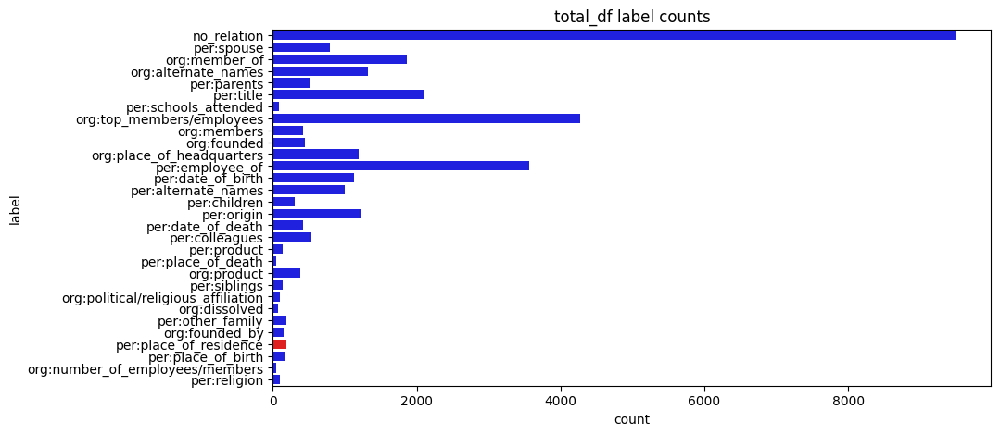

In [205]:
# 추가 이전 total 데이터의 label 개수 분포 시각화

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))

custom_palette = label_color_dict
sns.countplot(y='label', data=total_df, palette=custom_palette)
plt.title('total_df label counts')
plt.show()

/tmp/ipykernel_33033/3658631233.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='label', data=pd.concat([total_df,subject_ner_1_object_ner_1_df]), palette=custom_palette)


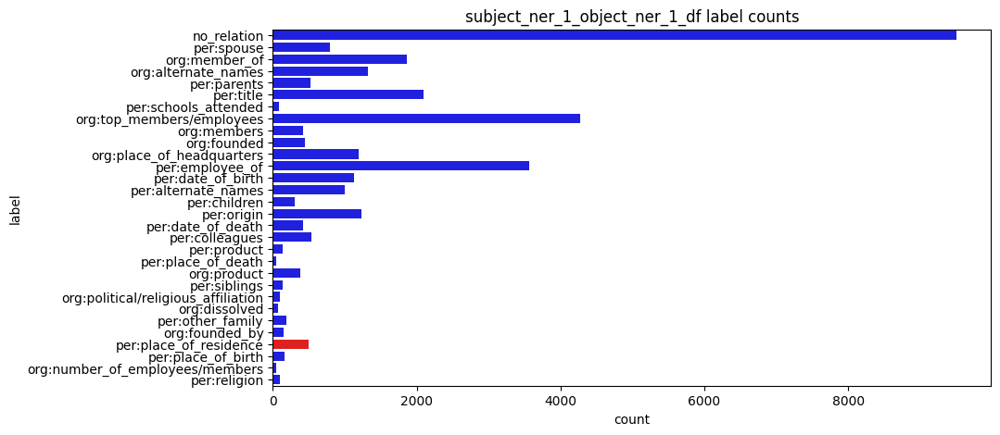

In [206]:
# 데이터 증강 이후

plt.figure(figsize=(10, 5))

custom_palette = label_color_dict
sns.countplot(y='label', data=pd.concat([total_df,subject_ner_1_object_ner_1_df]), palette=custom_palette)
plt.title('subject_ner_1_object_ner_1_df label counts')
plt.show()

In [207]:
# 증강된 데이터 저장

error1_augmented_df = pd.concat([total_df,subject_ner_1_object_ner_1_df])

error1_augmented_df.to_csv('/data/ephemeral/level2-klue-nlp-06/dataset/error1_augmented_df.csv', index=False)

In [208]:
# 데이터 9:1 분할 후 저장

from sklearn.model_selection import train_test_split

train_df, dev_df = train_test_split(error1_augmented_df, test_size=0.1, random_state=42)

train_df.to_csv('/data/ephemeral/level2-klue-nlp-06/dataset/error1_augment_train_df.csv', index=False)
dev_df.to_csv('/data/ephemeral/level2-klue-nlp-06/dataset/error1_augment_dev_df.csv', index=False)

# [오답률 2위 0.8181 및 데이터 부족] per:other_family 의 개체명 분석

In [209]:
ners = pd.read_csv('./ners.csv')
ners

,id,sentence,label,ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[('5월 22일', '기간'), ('교황', '직업'), ('율리오 1세', '인..."
1,15955,그러나 메르센부르크의 주교 테이도마르(Thietmar)와 마인츠 대주교 아리보(Ar...,per:spouse,"[('메르센부르크', '인물'), ('테이도마르', '인물'), ('Thietmar..."
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,no_relation,"[('새정치국민회의', '정부 행정'), ('국회의장', '직위, 직책'), ('자..."
3,7606,"한편, 고창군은 전라북도 군 단위에서는 최초로 지난 16일 여성가족부로부터 2019...",org:member_of,"[('고창군', '군, 면, 동'), ('전라북도', '도, 주'), (' 16일여..."
4,24814,선진 강연 문화를 선도하고 있는 장성아카데미는 지난해 9월 KRI 한국기록원으로부터...,org:alternate_names,"[('장성아카데미', '교육'), ('지난해 9월', '기간'), ('KRI', '..."
...,...,...,...,...
32413,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...",no_relation,"[('1회말', '스포츠수량'), ('이순철', '인물'), ('2사1', '스포츠..."
32414,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...",no_relation,"[('2009년 9월 16일', '기간'), ('아소', '인물'), ('국회', ..."
32415,465,고구려 장수왕(재위: 412년 음력 10월~491년 음력 12월)의 군사들이 한성으...,per:children,"[('고구려', '국가'), ('장수왕', '인물'), ('412년', '기간'),..."
32416,22194,태조 왕건을 도운 공신이자 927년 후백제와의 공산성 전투중 전사한 신숭겸과 김낙 ...,per:date_of_death,"[('태조', '인물'), ('왕건', '인물'), ('927년', '년'), ('..."


In [212]:
# label이 per:other_family 라벨인 것만 추출

per_other_family = ners[ners['label'] == 'per:other_family']
per_other_family

,id,sentence,label,ners
242,18208,제임스 5세와 마거릿 더글라스는 동복남매이며 제임스 5세의 딸 메리와 헨리 스튜어트...,per:other_family,"[('제임스', '인물'), ('5세', '나이'), ('마거릿', '인물'), (..."
508,31143,"후에 신라의 문무왕이 합병하고, 신문왕 때 소경(小京)을 두었으며 경덕왕 때 남원으...",per:other_family,"[('신라', '국가'), ('문무왕', '인물'), ('신문왕', '인물'), (..."
524,6431,742년부터 신라 경덕왕이 아버지인 성덕왕의 공덕을 널리 알리기 위해 만들려 했으나...,per:other_family,"[('742년부터', '기타'), ('신라', '국가'), ('경덕왕', '인물')..."
980,24851,사이메이 천황 사후 덴지 천황이 7년이나 즉위하지 않고 있었던 것이 아니라 사실은 ...,per:other_family,"[('사이메이', '인물'), ('천황', '직위, 직책'), ('덴지', '인물'..."
1016,25873,1881년 시아버지 알렉산드르 2세가 폭탄 테러의 희생자가 되자 알렉산드르 대공과 ...,per:other_family,"[('1881년', '년'), ('시아버지', '가족관계'), ('알렉산드르 2세'..."
...,...,...,...,...
31218,26071,건문제의 할아버지인 홍무제 연간에 황실을 보호할 울타리로써 홍무제가 자신의 아들들을...,per:other_family,"[('건문제', '인물'), ('할아버지', '가족관계'), ('홍무제', '인물'..."
31521,13215,"건갑의 아들 승색(承穡)은 아버지를 이어 애장왕 밑에서 승상으로 보필하였는데, 애장...",per:other_family,"[('건갑', '인물'), ('아들', '가족관계'), ('승색', '인물'), (..."
31566,18252,실재 에드워드 5세가 정당한 왕위 계승자였음에도 리처드 3세가 둘을 런던탑에 가둔뒤...,per:other_family,"[('에드워드', '인물'), ('5세', '인물'), ('리처드', '인물'), ..."
31750,3738,"자코바이트 운동은 19세기 초까지 계속되었으나, 제임스 2세 손자이자 성직자가 된 ...",per:other_family,"[('19세기 초까지', '기간'), ('제임스', '인물'), ('2세', '순서..."


In [227]:
per_other_family['ners'] = per_other_family['ners'].apply(lambda x: ast.literal_eval(x)) # turn string formatted like dict into real list

/tmp/ipykernel_33033/3319249425.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  per_other_family['ners'] = per_other_family['ners'].apply(lambda x: ast.literal_eval(x)) # turn string formatted like dict into real list


In [232]:
# ners에 존재하는 모든 desc를 추출하고 value_counts()를 통해 개수를 세어줌

desc_list = []
for i in per_other_family['ners']:
    for j in i:
        desc_list.append(j[1])

pd.Series(desc_list).value_counts()

인물            1089
가족관계           360
직위, 직책         141
국가              89
순서              88
기간              47
캐랙터             43
년               30
도시              20
직업              14
나이              10
수도               8
기타               6
방향               6
인원               5
군, 면, 동          5
도, 주             4
수량               4
민족, 종족           3
문화재              3
전쟁, 혁명, 전투       3
날짜 절기            3
의복, 섬유           2
1                2
정부 행정            2
산                2
달                2
천체               2
대륙               2
무기               1
부분명칭             1
꽃                1
상, 훈장            1
왕조시대             1
과일               1
미디어 방송           1
군사               1
건물               1
Name: count, dtype: int64

In [280]:
# ners에 가족관계가 들어있지 않은 것의 개수 ( 개체명 인식기가 제대로 파악하지 못한 샘플)
len(per_other_family[per_other_family['ners'].apply(lambda x: '가족관계' not in [i[1] for i in x])])

36

##  sentence에 인물이 2번 이상, 가족 관계가 1번 이상이 나오는 no_relation라벨 데이터의 경우 새롭게 per:other_family 라벨로 증강

In [293]:
# ners 불러오기
ners = pd.read_csv('./ners.csv')

# error1_augment_df에서 no_relation 라벨인 것만 추출

no_relation = ners[ners['label'] == 'no_relation']
no_relation

,id,sentence,label,ners
0,26569,"《리베리오 교황표》에 의하면, 5월 22일 교황 율리오 1세의 뒤를 이어 로마 주교...",no_relation,"[('5월 22일', '기간'), ('교황', '직업'), ('율리오 1세', '인..."
2,13409,새정치국민회의는 안정적인 국정 운영을 위해 공동 여당에서 국회의장을 차지해야 한다고...,no_relation,"[('새정치국민회의', '정부 행정'), ('국회의장', '직위, 직책'), ('자..."
6,20647,용인시에서는 2011년 신흥무관학교 100년과 용인출신 독립운동가를 주제로 학술행사...,no_relation,"[('용인시', '정부 행정'), ('2011년', '년'), ('신흥무관학교', ..."
19,8598,플레이오프에서는 2위 현대 유니콘스와 두산 베어스가 맞붙었는데 현대는 1998년부터...,no_relation,"[('2위', '순서'), ('현대', '경제'), ('유니콘스', '경제'), (..."
21,28921,그러나 이후 DTD의 주인 LG 트윈스가 2018시즌 정규시즌 2위에도 오르는 등 ...,no_relation,"[('LG', '경제'), ('트윈스', '스포츠'), ('2018', '년'), ..."
...,...,...,...,...
32407,3816,"그 후 스웨덴의 말뫼 교향악단의 수석 지휘자, 로열 스톡홀름 필하모닉 및 버밍엄 시...",no_relation,"[('스웨덴', '국가'), ('말뫼', '인물'), ('수석', '직위, 직책')..."
32410,12666,"주전 내야수인 박정권, 나주환이 부상으로 이탈하여 내야수, 외야수가 필요하였던 SK...",no_relation,"[('내야수인', '직업'), ('박정권', '인물'), ('나주환', '인물'),..."
32413,26593,"1회말 이순철의 도루를 곁들여 만든 2사1, 2루에서 김성한의 우전적시타로 1점을 ...",no_relation,"[('1회말', '스포츠수량'), ('이순철', '인물'), ('2사1', '스포츠..."
32414,1046,"2009년 9월 16일, 아소 내각이 총사직하고 국회에서 민주당 대표인 하토야마 유...",no_relation,"[('2009년 9월 16일', '기간'), ('아소', '인물'), ('국회', ..."


In [294]:
# no_relation의 ners의 desc에서 인물이 2번 이상 나오고 가족관계가 1번 이상 나오는 것만 추출


def check_per_family(x):

    per_count = 0
    family_count = 0

    for i in x:

        if len(i)>1:
            if i[1] == '인물':
                per_count += 1
                print(i[1], per_count)
            elif i[1] == '가족관계':
                family_count += 1
                print(i[1], family_count)
        else:
            continue

    if per_count >= 2 and family_count >= 1:
        return True
    else:
        return False
    
no_relation['check_per_family'] = no_relation['ners'].apply(lambda x: check_per_family(ast.literal_eval(x)))

인물 1
인물 1
인물 1
인물 2
인물 1
인물 2
인물 3
인물 4
인물 5
인물 1
인물 2
인물 3
인물 4
인물 5
인물 1
인물 2
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
인물 7
인물 8
인물 9
인물 10
인물 11
인물 1
인물 2
인물 1
인물 1
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
가족관계 1
인물 7
인물 1
인물 2
인물 1
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
인물 1
인물 1
인물 2
인물 3
인물 4
인물 5
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
인물 1
인물 2
인물 1
인물 1
인물 2
인물 1
인물 1
인물 1
인물 2
인물 3
인물 1
인물 1
인물 2
인물 3
인물 4
인물 1
인물 1
인물 2
인물 3
인물 4
인물 5
인물 1
인물 1
인물 2
인물 3
인물 4
가족관계 1
인물 5
인물 6
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
가족관계 1
인물 1
인물 1
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
인물 7
인물 8
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 4
인물 5
인물 1
인물 1
인물 2
인물 3
가족관계 1
인물 1
인물 1
인물 2
인물 1
인물 2
가족관계 1
인물 1
인물 2
인물 3
인물 1
인물 2
인물 3
인물 1
인물 1
인물 1
인물 2
인물 3
가족관계 1
인물 4
인물 1
인물 1
인물 2
인물 1
인물 2
가족관계 1
인물 1
인물 2
인물 1
인물 1
인물 2
인물 1
인물 2
인물 1
인물 2
인물 3
인물 4
인물 1
인물 2
인물 1
인물 2
인물 3
인물 4
인물 5
인물 6
인물 7
인물 8
인물 9
인물 10
인물 11
인물 1
인물 1
인물 2
인물 1
인물 1
인물 2
인물 3
인물 4
인물 1
인물 2
인물 1
인물

/tmp/ipykernel_33033/1017856373.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_relation['check_per_family'] = no_relation['ners'].apply(lambda x: check_per_family(ast.literal_eval(x)))


In [295]:
# check_per_family가 True인 것만 추출

no_relation = no_relation[no_relation['check_per_family'] == True]

In [297]:
no_relation

,id,sentence,label,ners,check_per_family
53,15885,"그러나, 헨리 3세의 뒤를 이어 잉글랜드의 왕이 된 에드워드 1세는 르웰린과 대립하...",no_relation,"[('헨리', '인물'), ('3세', '인물'), ('잉글랜드', '국가'), (...",True
172,16430,1570년대에 르네상스 인문주의자 조지 부캐넌이 『스코틀랜드의 역사』에서 키나드 1...,no_relation,"[('1570년대', '년'), ('조지', '인물'), ('부캐넌', '인물'),...",True
188,8876,1904년 12월 3일에 릭(Lick) 천문대에서 찰스 딜런 페라인(Charles ...,no_relation,"[('1904년 12월 3일', '기간'), ('릭', '건물'), ('Lick',...",True
223,6939,"2015년 초, 하지원은 중국 현대문학의 거장 위화의 소설 ‘허삼관 매혈기’를 기반...",no_relation,"[('2015년', '년'), ('하지원', '인물'), ('중국', '국가'), ...",True
271,16294,"1251년 7월 1일 형 몽케 칸이 몽골의 대칸으로 즉위하자, 쿠빌라이에게 남부군 ...",no_relation,"[('1251년', '년'), ('7월', '달'), ('1일', '날짜 절기'),...",True
...,...,...,...,...,...
32076,25287,그 뒤 1377년 잉글랜드에서는 에드워드 3세가 죽고 리처드 2세가 왕위에 올랐으며...,no_relation,"[('1377년', '년'), ('잉글랜드', '국가'), ('에드워드 3세', '...",True
32172,7099,앞서 마하 와치랄롱꼰 국왕은 지난 7월 말 시니낫에게 라마 6세 국왕 이후 100년...,no_relation,"[('마하', '인물'), ('와치랄롱꼰', '인물'), ('국왕', '직위, 직책...",True
32219,17422,"구카이라이는 중국좌익작가연맹, 중국 공산주의 청년단 출신으로 1949년 이전부터 중...",no_relation,"[('구카이라이', '인물'), ('중국좌익작가연맹', '기타'), ('중국', '...",True
32248,26609,"이언도가 권력을 탈취한 이후, 노연창의 아버지 노광조를 위해 오랫동안 모사로 활약했...",no_relation,"[('이언도', '인물'), ('노연창', '인물'), ('아버지', '가족관계')...",True


In [296]:
no_relation[no_relation['check_per_family'] == True]['sentence'][172]

'1570년대에 르네상스 인문주의자 조지 부캐넌이 『스코틀랜드의 역사』에서 키나드 1세의 부친이 픽트인들에게 어떻게 살해당했으며 그래서 키나드가 어떻게 픽트인들을 정복해 복수했는지를 소상히 서술하여 "키나드 1세가 픽트를 정복하고 스코틀랜드를 세움"이라는 줄거리에 살을 붙였다.'